# <font color = 'orange'> Yolo v5 My code

---

## <font color='blue'> 1. Clone the yolov5 repo and install requirements

In [20]:
!git clone https://github.com/ultralytics/yolov5

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [21]:
ls

Hard-Hat-Sample-3/  sample_data/  yolov5/


In [22]:
!pip install -r yolov5/requirements.txt

In [23]:
import torch

print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 2.1.0+cu118 CPU


---

## <font color='blue'> 2. Download annoted images

In [24]:
!pip install roboflow

In [25]:
from roboflow import Roboflow
rf = Roboflow(api_key="**************")
project = rf.workspace("darshan-r-m").project("hard-hat-sample-hu9gr")
dataset = project.version(3).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Hard-Hat-Sample-3 in yolov5pytorch:: 100%|██████████| 491/491 [00:00<00:00, 4173.74it/s]


---

## <font color='blue'> 3. Create the custom yolo model by changing the output neurons

In [26]:
%cat Hard-Hat-Sample-3/data.yaml

names:
- head
- helmet
- person
nc: 3
roboflow:
  license: Public Domain
  project: hard-hat-sample-hu9gr
  url: https://app.roboflow.com/darshan-r-m/hard-hat-sample-hu9gr/3
  version: 3
  workspace: darshan-r-m
test: ../test/images
train: Hard-Hat-Sample-3/train/images
val: Hard-Hat-Sample-3/valid/images


In [27]:
%cat yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]

In [28]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def create_custom_yolov5_model(location, cell):
    with open(location, 'w') as f:
        f.write(cell.format(**globals()))

In [29]:
import yaml
with open("Hard-Hat-Sample-3/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

num_classes

'3'

In [30]:
%%create_custom_yolov5_model yolov5/models/custom_yolov5s.yaml
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [31]:
%cat yolov5/models/custom_yolov5s.yaml

nc: 3  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (

---

## <font color='blue'> 4. Model Training

In [41]:
ls

Hard-Hat-Sample-3/  sample_data/  yolov5/


In [46]:
!python yolov5/train.py --img 416 --batch 5 --epochs 2 --data yolov5/Hard-Hat-Sample-3/data.yaml --cfg yolov5/models/custom_yolov5s.yaml --weights 'yolov5s.pt' --name yolov5s_results  --cache

2023-11-25 18:19:18.012301: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-25 18:19:18.012400: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-25 18:19:18.012476: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=yolov5/models/custom_yolov5s.yaml, data=yolov5/Hard-Hat-Sample-3/data.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=2, batch_size=5, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_

---

## <font color='blue'> 5. Visulaizing the loos 

In [47]:
%load_ext tensorboard
%tensorboard --logdir yolov5/runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

---

## <font color='blue'> 6. Test image Detection

In [48]:
!python yolov5/detect.py --weights yolov5/runs/train/yolov5s_results24/weights/best.pt --img 416 --conf 0.005 --source yolov5/Hard-Hat-Sample-3/test/images

detect: weights=['yolov5/runs/train/yolov5s_results24/weights/best.pt'], source=yolov5/Hard-Hat-Sample-3/test/images, data=yolov5/data/coco128.yaml, imgsz=[416, 416], conf_thres=0.005, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-247-g3f02fde Python-3.10.12 torch-2.1.0+cu118 CPU

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/10 /content/yolov5/Hard-Hat-Sample-3/test/images/000008_jpg.rf.05fa76d0c386d7fb5a6eda63c470c904.jpg: 416x416 23 heads, 135 helmets, 16 persons, 179.9ms
image 2/10 /content/yolov5/Hard-Hat-Sample-3/test/images/000011_jpg.rf.1a64c410967c02860a5d65eba5bb117d.jpg: 416x416 24 heads, 141 h

---

## <font color='blue'> 7. Display detected images

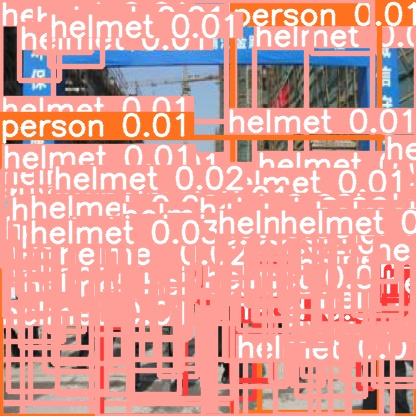

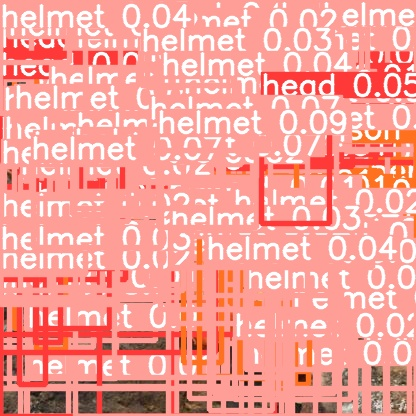

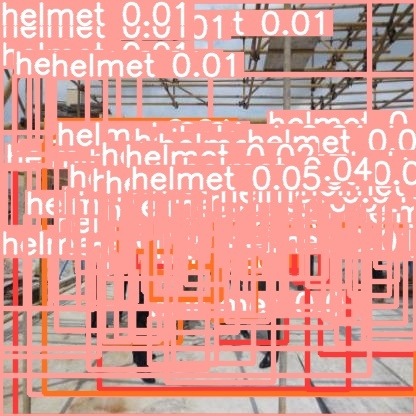

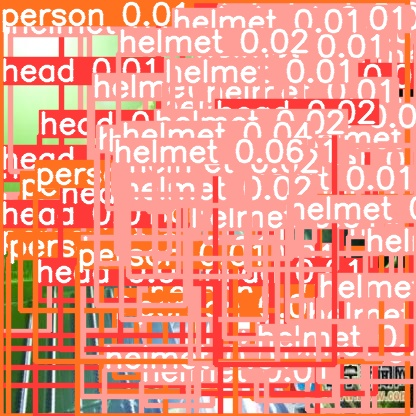

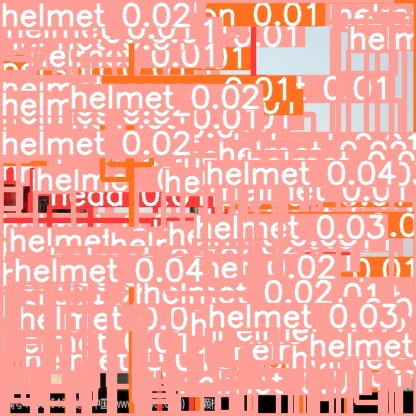

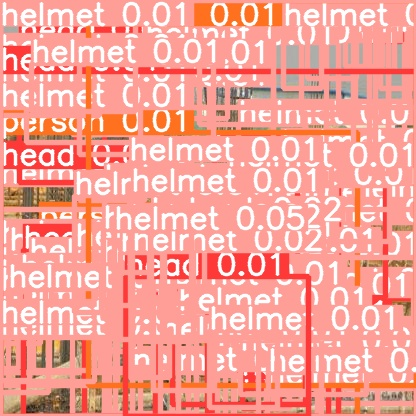

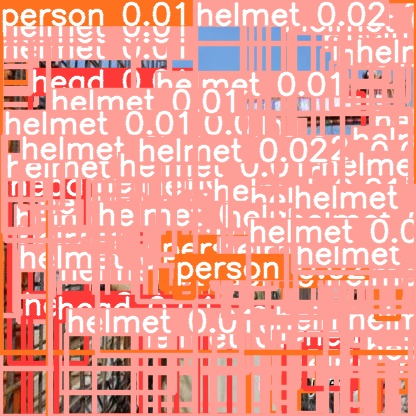

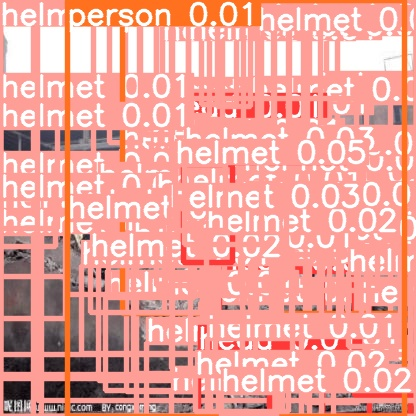

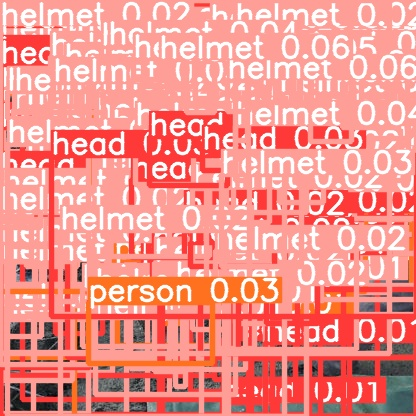

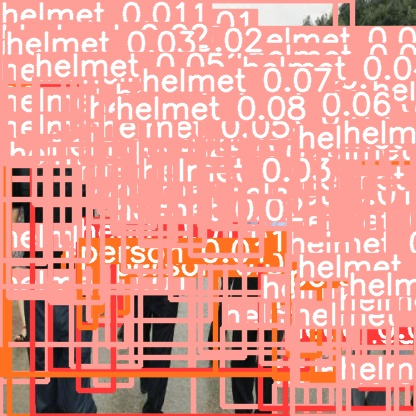

In [49]:
import glob
from IPython.display import Image, display

for image_name in glob.glob('yolov5/runs/detect/exp2/*.jpg'):
    display(Image(filename = image_name))
    print('\n')

---

## <font color='blue'> 8. Download the best weights for the prediction

In [51]:
from google.colab import files

files.download('yolov5/runs/train/yolov5s_results24/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---